In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!git reset --hard 68211f72c99915a15855f7b99bf5d93f5631330f

Cloning into 'yolov5'...
remote: Enumerating objects: 6383, done.
remote: Counting objects: 100% (102/102), done.
remote: Compressing objects: 100% (83/83), done.
remote: Total 6383 (delta 54), reused 48 (delta 19), pack-reused 6281
Receiving objects: 100% (6383/6383), 8.59 MiB | 22.96 MiB/s, done.
Resolving deltas: 100% (4361/4361), done.
/content/yolov5
HEAD is now at 68211f7 FROM nvcr.io/nvidia/pytorch:20.10-py3 (#1553)


In [ ]:
!pip install -qr requirements.txt
!pip install torch==1.7.1+cu110 torchvision==0.8.2+cu110 torchaudio===0.7.2 -f https://download.pytorch.org/whl/torch_stable.html
import torch

from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

     |████████████████████████████████| 645kB 11.1MB/s 
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |███████████████████████         | 834.1MB 48.5MB/s eta 0:00:07tcmalloc: large alloc 1147494400 bytes == 0x55838590e000 @  0x7f8ee415b615 0x55834bc9acdc 0x55834bd7a52a 0x55834bc9dafd 0x55834bd8efed 0x55834bd11988 0x55834bd0c4ae 0x55834bc9f3ea 0x55834bd117f0 0x55834bd0c4ae 0x55834bc9f3ea 0x55834bd0e32a 0x55834bd8fe36 0x55834bd0d853 0x55834bd8fe36 0x55834bd0d853 0x55834bd8fe36 0x55834bd0d853 0x55834bd8fe36 0x55834be123e1 0x55834bd726a9 0x55834bcddcc4 0x55834bc9e559 0x55834bd124f8 0x55834bc9f30a 0x55834bd0d3b5 0x55834bd0c7ad 0x55834bc9f3ea 0x55834bd0d3b5 0x55834bc9f30a 0x55834bd0d3b5
     |█████████████████████████████▏  | 1055.7MB 1.4MB/s eta 0:01:15tcmalloc: large alloc 1434370048 bytes == 0x5583c9f64000 @  0x7f8ee415b615 0x55834bc9acdc 0x55834bd7a52a 0x55834bc9dafd 0x55834bd8efed 0x55834bd11988 0x55834bd0c4ae 0x55834bc9f3ea 0x55834bd117f0 0x55834bd0c4ae 0x55

In [ ]:
%cd /content

/content


In [ ]:
!curl -L "https://public.roboflow.com/ds/q0TdDzkNWG?key=ly4HzlxQxK" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0    678      0  0:00:01  0:00:01 --:--:--   678
100 46.0M  100 46.0M    0     0  18.5M      0  0:00:02  0:00:02 --:--:-- 67.3M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/img-105_jpg.rf.3fe9dff3d1631e79ecb480ff403bcb86.jpg  
 extracting: test/images/img-107_jpg.rf.2e40485785f6e5e2efec404301b235c2.jpg  
 extracting: test/images/img-146_jpg.rf.61be25b3053a51f622a244980545df2b.jpg  
 extracting: test/images/img-161_jpg.rf.211541e7178a4a93ec0680f26b905427.jpg  
 extracting: test/images/img-168_jpg.rf.af3590e07b06b43e91fa53990ff94af3.jpg  
 extracting: test/images/img-179_jpg.rf.8632eb0d9b75fefe144829e67b75015a.jpg  
 extracting: test/images/img

In [ ]:
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 1
names: ['pothole']

In [ ]:
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
%cat /content/yolov5/models/yolov5s.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-

In [ ]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5
!python train.py --img 416 --batch 16 --epochs 200 --data '/content/data.yaml' --cfg /content/yolov5/models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
Using torch 1.7.1+cu110 CUDA:0 (Tesla K80, 11441MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='/content/yolov5/models/custom_yolov5s.yaml', data='/content/data.yaml', device='', epochs=200, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], local_rank=-1, log_imgs=16, multi_scale=False, name='yolov5s_results', noautoanchor=False, nosave=False, notest=False, project='runs/train', rect=False, resume=False, save_dir='runs/train/yolov5s_results', single_cls=False, sync_bn=False, total_batch_size=16, weights='', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir runs/train", view at http://localhost:6006/
2021-05-24 11:11:32.521149: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
Hyperparameters {'lr0': 0.01, 'lrf': 0.2, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0, 'warmup_

In [ ]:
%cd /content/yolov5
!python detect.py --weights /content/yolov5/runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source ../test/images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='../test/images', update=False, view_img=False, weights=['/content/yolov5/runs/train/yolov5s_results/weights/best.pt'])
Using torch 1.7.1+cu110 CUDA:0 (Tesla K80, 11441MB)

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients
image 1/67 /content/test/images/img-105_jpg.rf.3fe9dff3d1631e79ecb480ff403bcb86.jpg: 416x416 1 potholes, Done. (0.032s)
image 2/67 /content/test/images/img-107_jpg.rf.2e40485785f6e5e2efec404301b235c2.jpg: 416x416 1 potholes, Done. (0.032s)
image 3/67 /content/test/images/img-146_jpg.rf.61be25b3053a51f622a244980545df2b.jpg: 416x416 1 potholes, Done. (0.032s)
image 4/67 /content/test/images/img-161_jpg.rf.211541e7178a4a93ec0680f26b905427.jpg: 416x416 1 potholes, Done. (0.032s)
image 5/67 /content/test/images/img-168_jpg.rf.

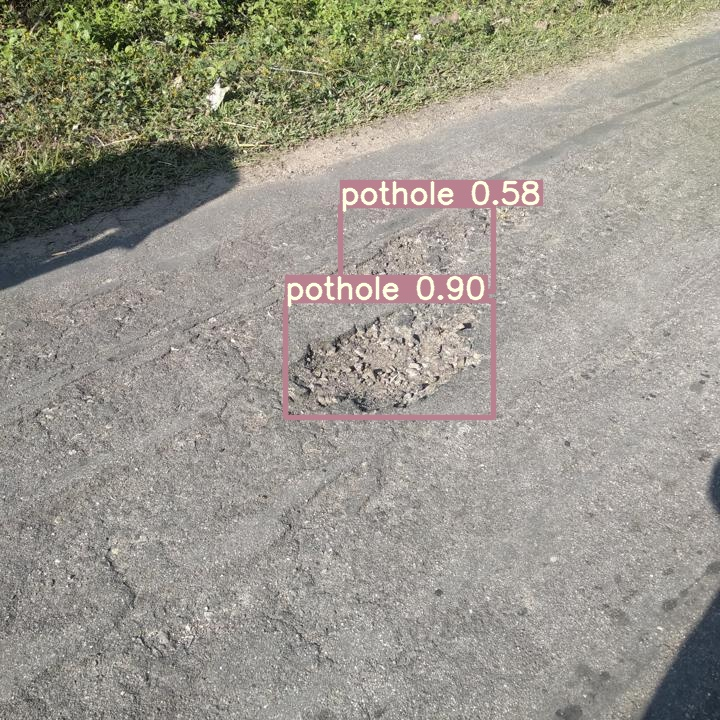

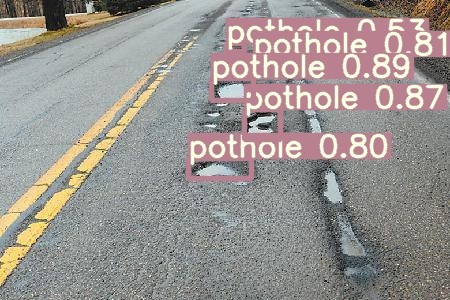

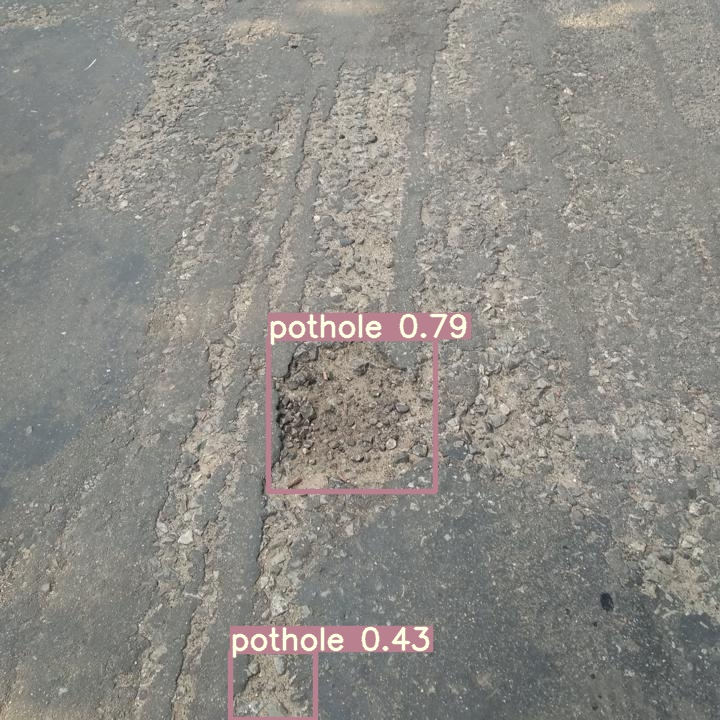

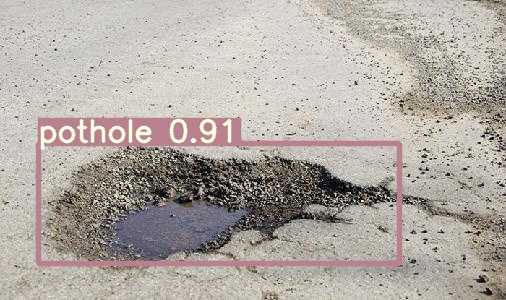

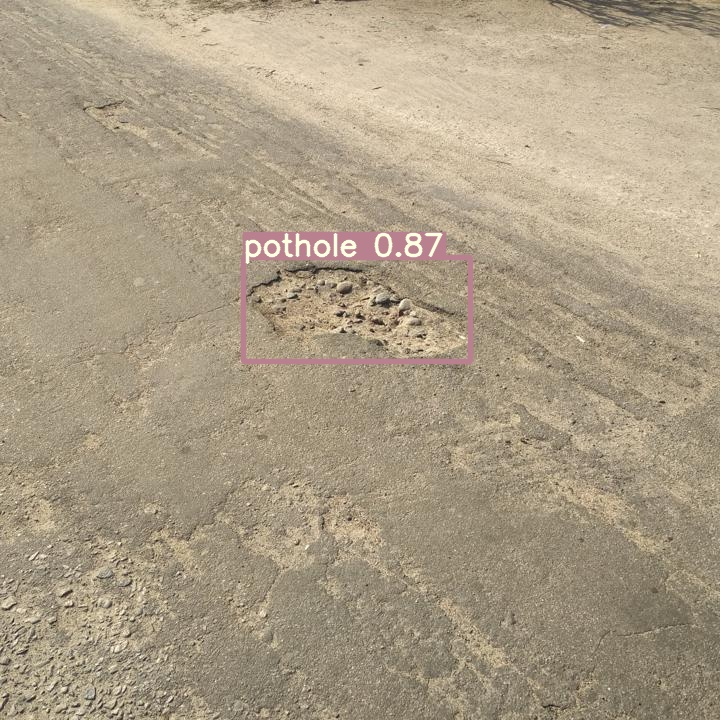

...

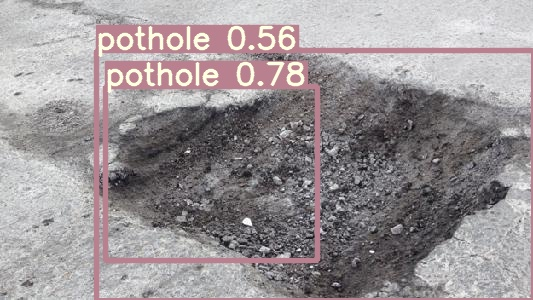

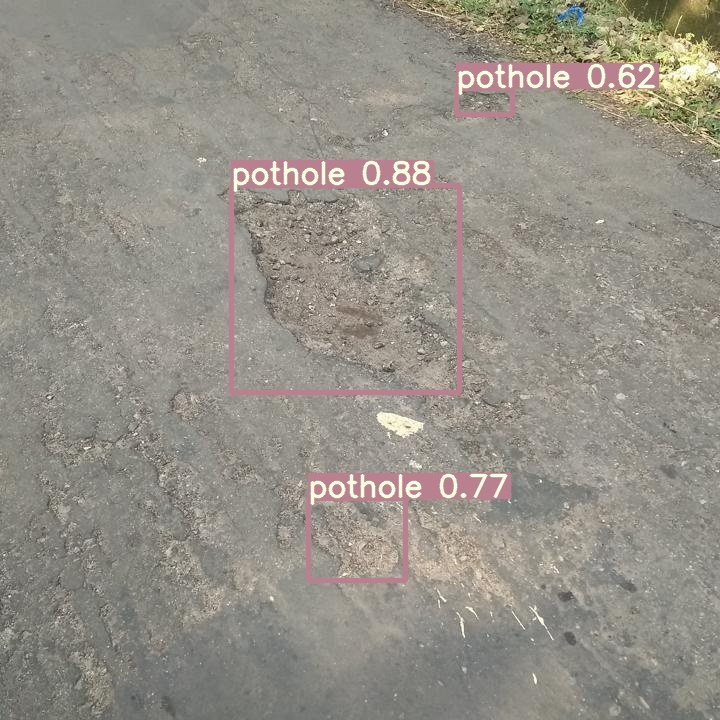

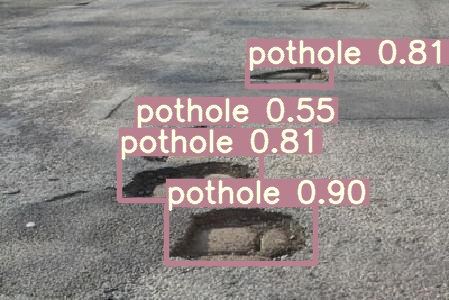

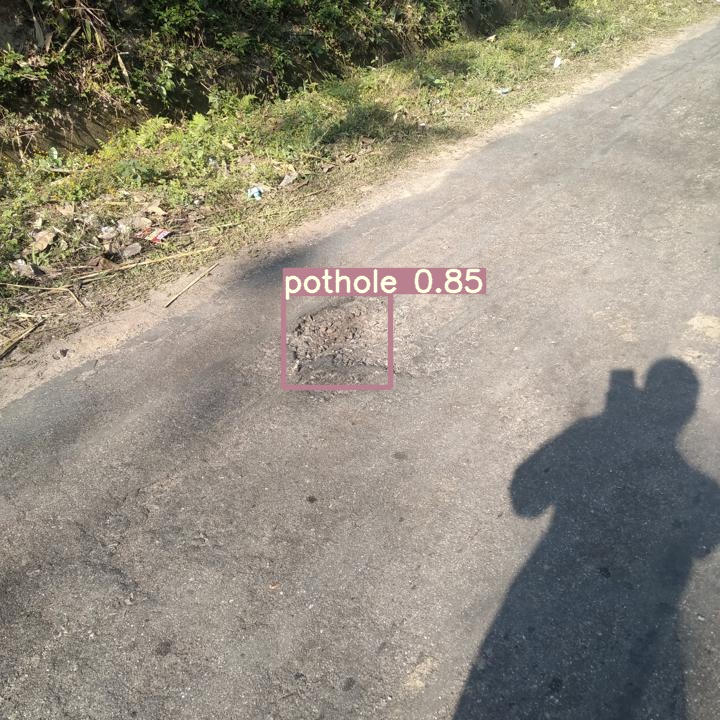

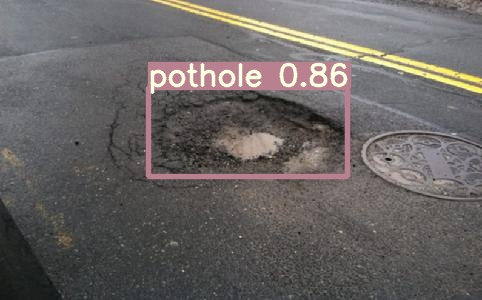

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'):
    display(Image(filename=imageName))
    print("\n")

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/yolov5s_results/weights/best.pt --source ../pothole.mp4 --conf 0.4

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='../pothole.mp4', update=False, view_img=False, weights=['/content/yolov5/runs/train/yolov5s_results/weights/best.pt'])
Using torch 1.7.1+cu110 CUDA:0 (Tesla K80, 11441MB)

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients
video 1/1 (1/343) /content/pothole.mp4: 384x640 1 potholes, Done. (0.031s)
video 1/1 (2/343) /content/pothole.mp4: 384x640 1 potholes, Done. (0.029s)
video 1/1 (3/343) /content/pothole.mp4: 384x640 1 potholes, Done. (0.030s)
video 1/1 (4/343) /content/pothole.mp4: 384x640 1 potholes, Done. (0.029s)
video 1/1 (5/343) /content/pothole.mp4: 384x640 1 potholes, Done. (0.029s)
video 1/1 (6/343) /content/pothole.mp4: 384x640 1 potholes, Done. (0.029s)
video 1/1 (7/343) /content/pothole.mp4: 384x640 1 potholes, Done. (0.029s)
video 1/1 (8/343) 

In [ ]:
import io
from IPython.display import HTML
from base64 import b64encode
def show_video(file_name, width=640):
  # show resulting deepsort video
  mp4 = open(file_name,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  return HTML("""
  <video width="{0}" controls>
        <source src="{1}" type="video/mp4">
  </video>
  """.format(width, data_url))

In [ ]:
path_output = os.path.join("/content/yolov5/runs/detect/exp3","pothole.mp4")
show_video(path_output, width=960)